In [ ]:
!pip install -U scikit-image

     |████████████████████████████████| 13.5 MB 4.8 MB/s 
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.18.3
    Uninstalling scikit-image-0.18.3:
      Successfully uninstalled scikit-image-0.18.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
# to run in google colab
import sys

if "google.colab" in sys.modules:
    import subprocess

    subprocess.call("apt-get install subversion".split())
    subprocess.call(
        "svn export https://github.com/YoniChechik/AI_is_Math/trunk/c_02b_filtering_and_resampling/Tour_Eiffel.jpg".split()
    )



In [ ]:
from google.colab import files as FILE
import os
import requests

img_data = requests.get('https://learnopencv.com/wp-content/uploads/2021/06/input_image-1.jpg').content

with open('tigre.jpg', 'wb') as handler:
    handler.write(img_data)

In [ ]:
from skimage import data
from  skimage import io 
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt


/usr/local/lib/python3.7/dist-packages/skimage/io/manage_plugins.py:23: UserWarning: Your installed pillow version is < 8.1.2. Several security issues (CVE-2021-27921, CVE-2021-25290, CVE-2021-25291, CVE-2021-25293, and more) have been fixed in pillow 8.1.2 or higher. We recommend to upgrade this library.
  from .collection import imread_collection_wrapper


## Filtro Gaussiano


Função **[GaussianBlur(src, ksize,sigma) ](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_filtering/py_filtering.html)**

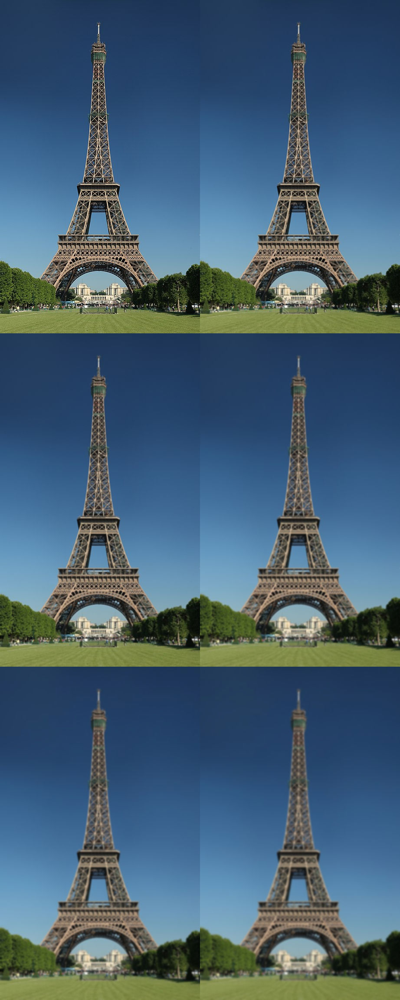

In [ ]:
# lendo a imagem e transformando para escala de cinza
img = cv2.imread('Tour_Eiffel.jpg')

suave = np.vstack([
 np.hstack([img,
 cv2.GaussianBlur(img, (3, 3), 0)]),
 np.hstack([cv2.GaussianBlur(img, ( 5, 5), 0),
 cv2.GaussianBlur(img, (7, 7), 0)]),
 np.hstack([cv2.GaussianBlur(img, ( 9, 9), 0),
 cv2.GaussianBlur(img, (11, 11), 0)]),
 ])

cv2_imshow(suave)




## Função filter2D()


```
filter2D(src, ddepth, kernel)
```


*  The first argument is the source image
*  The second argument is ddepth, which indicates the depth of the resulting image. A value of -1 indicates that the final image will also have the same depth as the source image.
*  The final input argument is the kernel, which we apply to the source image







## Filtro Laplaciano
**Referência**: [cv2.Laplacian()](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gad78703e4c8fe703d479c1860d76429e6)

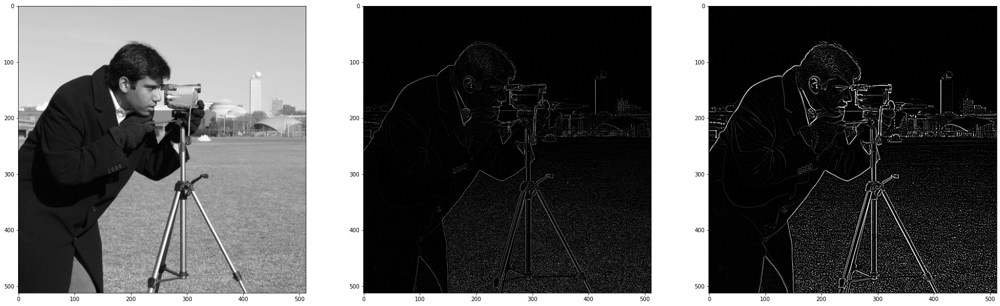

In [ ]:

src = data.camera()

lp_kernel = np.array([[0, 1, 0],
                    [1,-4, 1],
                    [0, 1, 0]])

lp_kernel4 = np.array([[0, 1, 1, 0],
                      [1,-2, -2, 1],
                      [1,-2, -2, 1],
                      [0, 1, 1, 0]])

result_lp = cv2.filter2D(src=src, ddepth=-1, kernel=lp_kernel)
result_lp4 = cv2.filter2D(src=src, ddepth=-1, kernel=lp_kernel4)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(1, 3, 1)
plt.imshow(src, cmap="gray")
plt.subplot(1, 3, 2)
plt.imshow(result_lp, cmap="gray")
plt.subplot(1, 3, 3)
plt.imshow(result_lp4, cmap="gray")
plt.show()




##  Filtro de Prewitt

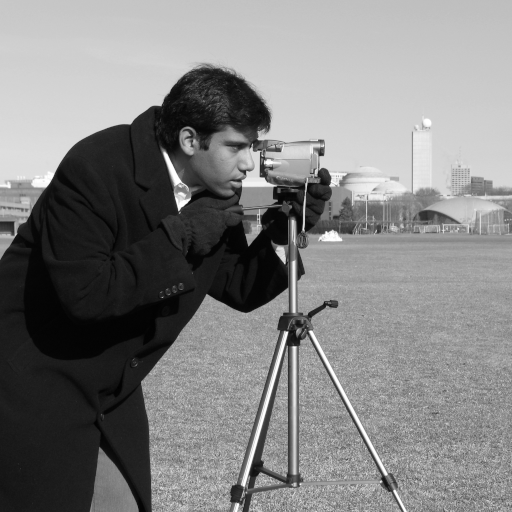

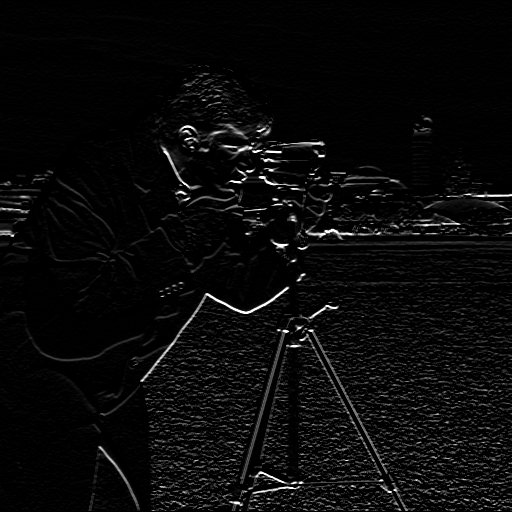

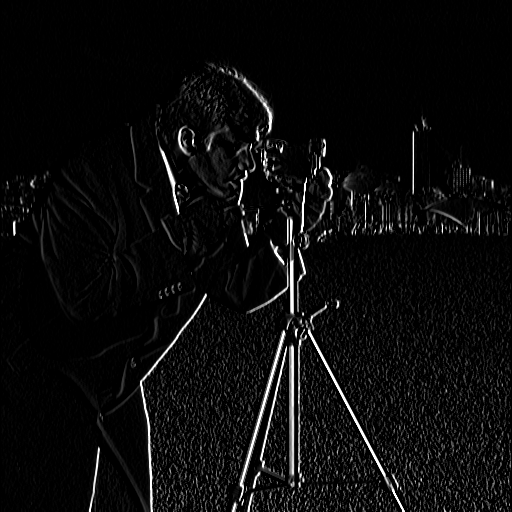

In [ ]:
from skimage import filters

image = data.camera()

# Filtro de Prewitt - BPF (slide 107)
h_prewitt = np.array([[-1, -1, -1],
                    [0, 0, 0],
                    [1, 1, 1]])
# filter2D() function can be used to apply kernel to an image.
# Where ddepth is the desired depth of final image. ddepth is -1 if...
# ... depth is same as original or source image.
prewittH = cv2.filter2D(src=image, ddepth=-1, kernel=h_prewitt)

h_prewitt2 = np.array([[-1, 0, 1],
                    [-1, 0, 1],
                    [-1, 0, 1]])

prewittV = cv2.filter2D(src=image, ddepth=-1, kernel=h_prewitt2)

cv2_imshow(image)
cv2_imshow(prewittH) 
cv2_imshow(prewittV)


## [skimage.filters.prewitt](https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.prewitt)

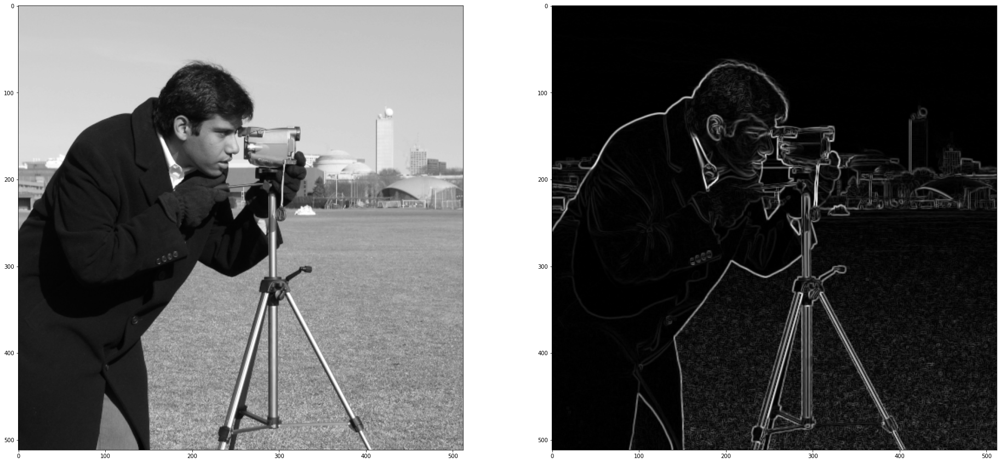

In [ ]:
from skimage import data
from skimage import filters
import matplotlib.pyplot as plt

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

camera = data.camera()
edges = filters.prewitt(camera)

plt.subplot(1, 2, 1)
plt.imshow(camera, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(edges, cmap="gray")
plt.show()



## Filtro de Sobel
**Referências**: https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Gradient_Sobel_Laplacian_Derivatives_Edge_Detection.php

https://learnopencv.com/edge-detection-using-opencv/#sobel-edge



Sobel X


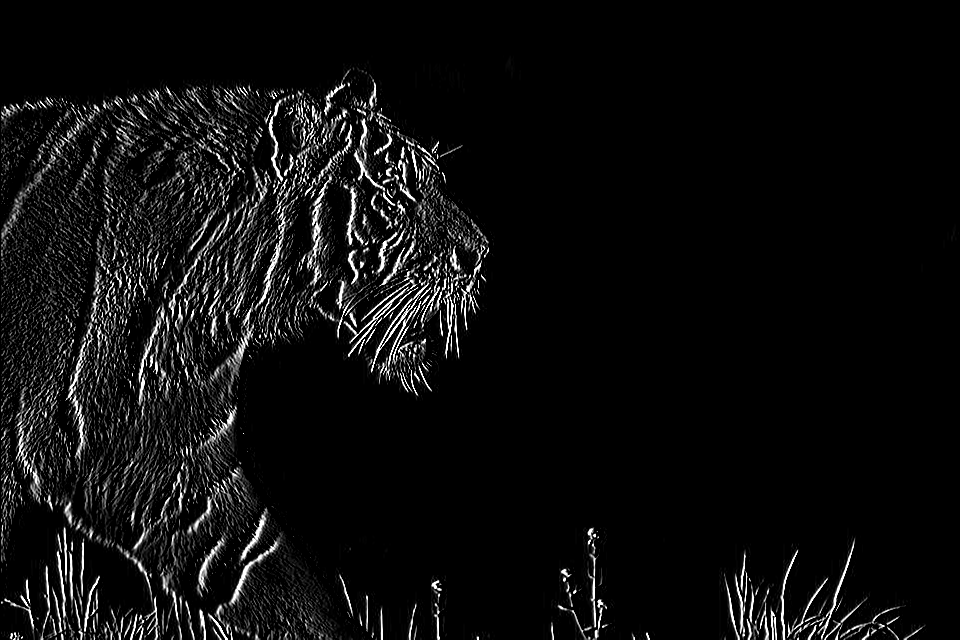

Sobel Y


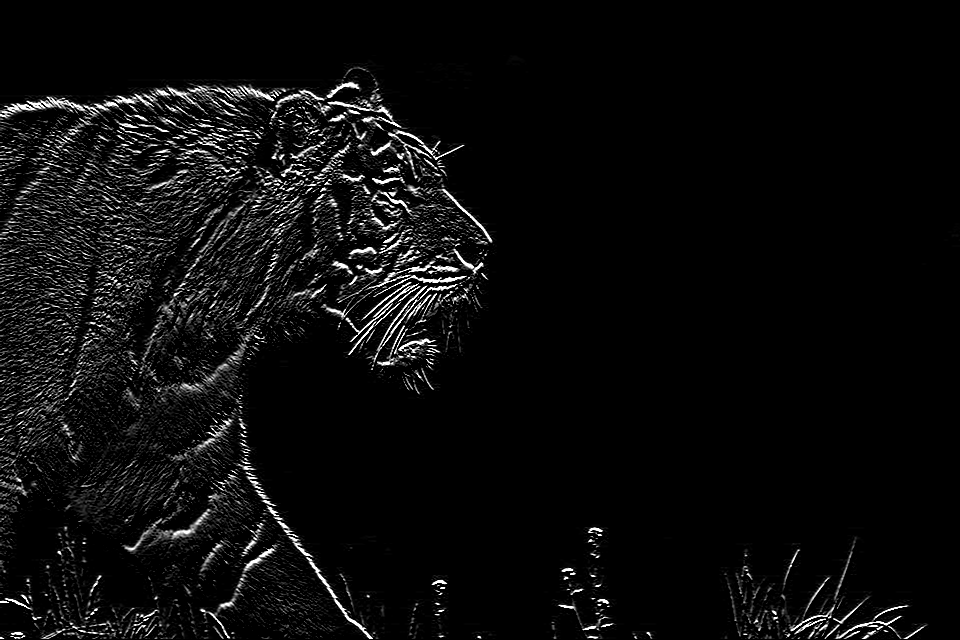

Sobel X Y using Sobel() function


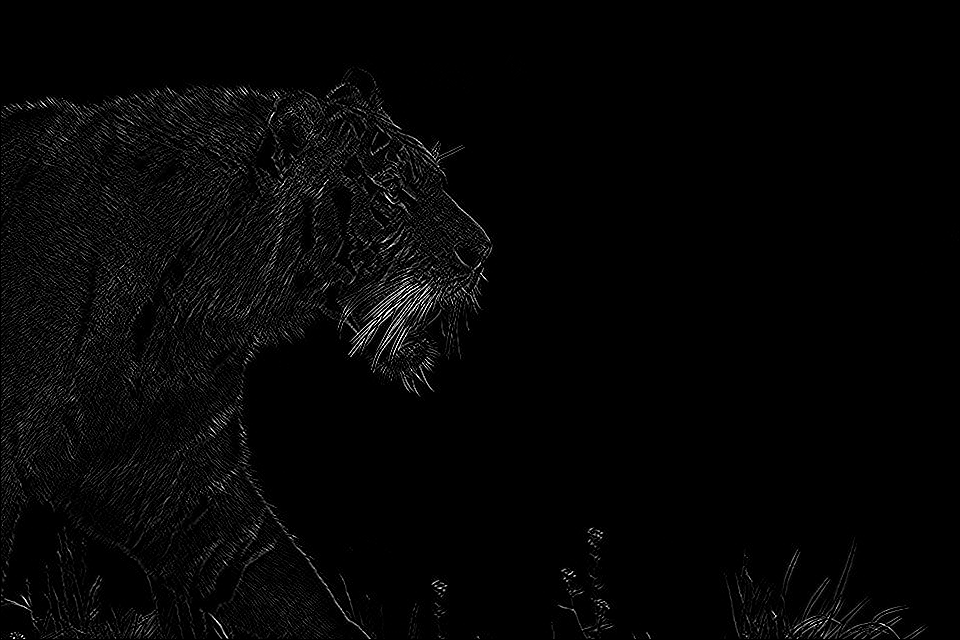

In [ ]:

img = cv2.imread('tigre.jpg',0)
# img = data.camera()

# Blur the image for better edge detection
# img_blur = cv2.GaussianBlur(img,(3,3), sigmaX=0, sigmaY=0) 

# Sobel Edge Detection
sobelx = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=0) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=0, dy=1) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=1) # Combined X and Y Sobel Edge Detection

# Display Sobel Edge Detection Images
print('Sobel X')
cv2_imshow(sobelx)

print('Sobel Y')
cv2_imshow(sobely)

print('Sobel X Y using Sobel() function')
cv2_imshow(sobelxy)

## Filtro de Média

https://docs.opencv.org/3.4/d4/d13/tutorial_py_filtering.html

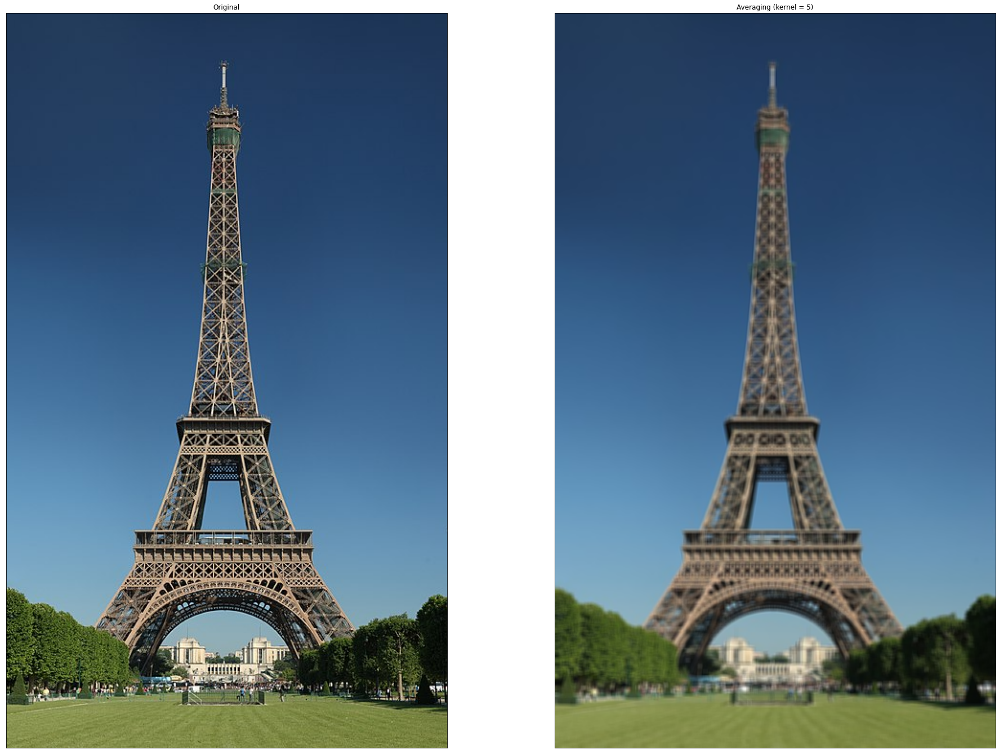

In [ ]:
import numpy as np
import cv2 
from matplotlib import pyplot as plt
from skimage.data import *

# img = cat()
img = cv2.imread('Tour_Eiffel.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

dst = cv2.blur(img,(5,5))
dst = cv2.blur(img,(11,11))

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('Averaging (kernel = 5)')
plt.xticks([]), plt.yticks([])
plt.show()

## Filtro de Mediana

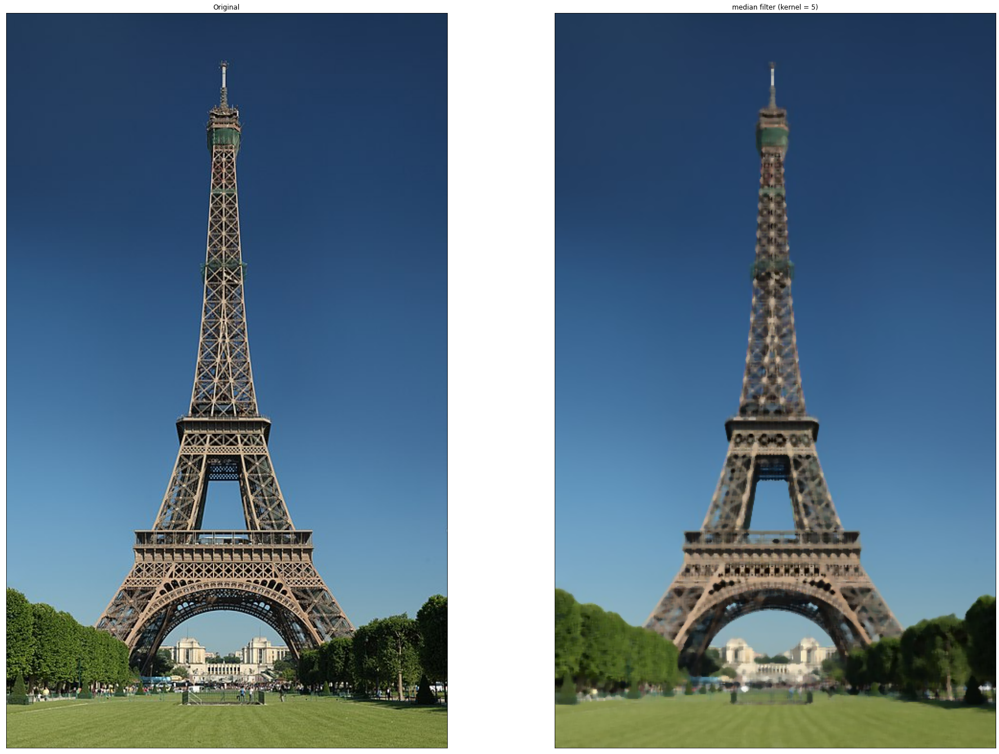

In [ ]:
import numpy as np
import cv2 
from matplotlib import pyplot as plt

img = cv2.imread('Tour_Eiffel.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

dst = cv2.medianBlur(img,ksize=5)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)


plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('median filter (kernel = 5)')
plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
#@title 
from google.colab.patches import cv2_imshow # for image display

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

print('Filtro da média')
# Filtro da média
avg_resu = cv2.blur(img,(5,5))
cv2_imshow(avg_resu)

print('Filtro de mediana')
median_resu = cv2.medianBlur(img,ksize=5)
cv2_imshow(median_resu)

print('Filtro Gaussiano')

gaussian_resu = cv2.GaussianBlur(img,(5,5),0)
cv2_imshow(gaussian_resu)


## Filtros em cascata
https://docs.opencv.org/3.4/Laplace_Operator_Tutorial_Original_Image.jpg

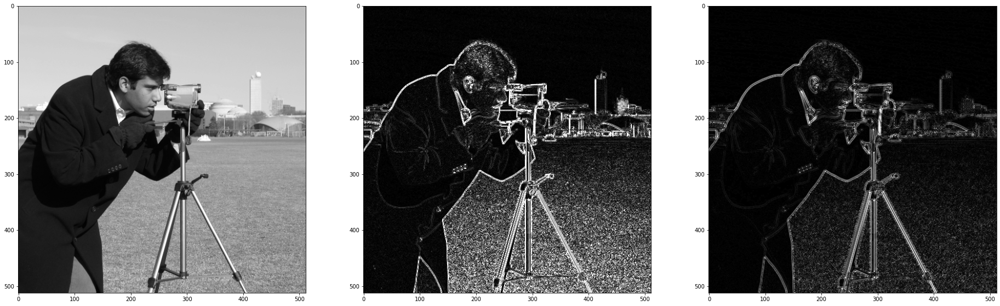

In [ ]:
"""
@file laplace_demo.py
@brief Sample code showing how to detect edges using the Laplace operator
"""
import cv2
from skimage.data import camera
import matplotlib.pyplot as plt

# [variables]
# Declare the variables we are going to use
ddepth = cv2.CV_16S
kernel_size = 3
window_name = "Laplace Demo"

# # src = cv2.imread(cv.samples.findFile(imageName), cv.IMREAD_COLOR) # Load an image
src = camera()

# [reduce_noise]
# Remove noise by blurring with a Gaussian filter and then apply Laplace function
# [laplacian]
dst1 = cv2.Laplacian(src, ddepth, ksize=kernel_size)
dst2 = cv2.Laplacian(cv2.GaussianBlur(src, (3, 3), 0), ddepth, ksize=kernel_size)
# [laplacian]

# [convert]
# converting back to uint8
abs_dst = cv2.convertScaleAbs(dst1)
# [convert]

# [display]
# cv.imshow(window_name, abs_dst)
# cv.waitKey(0)
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(1, 3, 1)
plt.imshow(src, cmap="gray")
plt.subplot(1, 3, 2)
plt.imshow(abs_dst, cmap="gray")
plt.subplot(1, 3, 3)
plt.imshow(cv2.convertScaleAbs(dst2), cmap="gray")
plt.show()

# [display]